<a href="https://colab.research.google.com/github/StudentsAntoniPartyka/ML/blob/main/homework9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# Define the MLP model architecture
class MLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.flatten = nn.Flatten()
        self.linear1 = nn.Linear(28*28, 1024)   # 784 -> 1024
        self.linear2 = nn.Linear(1024, 2048)    # 1024 -> 2048
        self.linear3 = nn.Linear(2048, 256)     # 2048 -> 256
        self.output = nn.Linear(256, 10)        # 256 -> 10 (class scores)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.05)
    def forward(self, x):
        # Flatten the 28x28 input into 784-dim vector
        x = self.flatten(x)
        # Forward pass through hidden layers with ReLU activations
        x = self.relu(self.linear1(x))
        x = self.relu(self.linear2(x))
        x = self.relu(self.linear3(x))
        # Output layer (logits for 10 classes)
        x = self.output(x)
        # Apply dropout to the output (dropout is inactive during evaluation)
        x = self.dropout(x)
        return x

# Prepare MNIST dataset with normalization
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))  # Normalize to mean=0.1307, std=0.3081
])
trainset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
testset  = datasets.MNIST(root='./data', train=False, download=True, transform=transform)
trainloader = DataLoader(trainset, batch_size=2048, shuffle=True)
testloader  = DataLoader(testset, batch_size=1024, shuffle=False)

# Initialize the model and move to device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MLP().to(device)

# Load pre-trained model weights if available, otherwise train the model
try:
    model.load_state_dict(torch.load('mnist_mlp.pth', map_location=device))
    model.eval()
    print("Loaded pre-trained model.")
except Exception as e:
    print("Pre-trained model not found. Training the MLP from scratch...")
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.CrossEntropyLoss()
    model.train()
    num_epochs = 5
    for epoch in range(num_epochs):
        running_loss = 0.0
        for batch_inputs, batch_labels in trainloader:
            batch_inputs, batch_labels = batch_inputs.to(device), batch_labels.to(device)
            optimizer.zero_grad()
            outputs = model(batch_inputs)
            loss = criterion(outputs, batch_labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * batch_inputs.size(0)
        epoch_loss = running_loss / len(trainloader.dataset)
        print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {epoch_loss:.4f}")
    # Save the trained model for future use
    model.eval()
    torch.save(model.state_dict(), 'mnist_mlp.pth')
    # Evaluate on test set
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in testloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    test_acc = correct / total
    print(f"Training complete. Test Accuracy: {test_acc:.4f}")


100%|██████████| 9.91M/9.91M [00:01<00:00, 5.81MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 153kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.45MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 5.10MB/s]


Pre-trained model not found. Training the MLP from scratch...
Epoch 1/5, Training Loss: 0.6958
Epoch 2/5, Training Loss: 0.2007
Epoch 3/5, Training Loss: 0.1294
Epoch 4/5, Training Loss: 0.0951
Epoch 5/5, Training Loss: 0.0730
Training complete. Test Accuracy: 0.9793


**Task 1: Generate One "Dream" Image per Digit (0–9)**

In this task, we will generate a batch of 10 images such that each image is classified as a specific digit (0 through 9) by our trained network. We start with an initial batch of ten random noise images and then treat the pixel values of these images as trainable parameters. We perform gradient descent on the input pixels to minimize the classification loss (cross-entropy) for the target labels 0–9.

In [2]:
# Task 1: Optimize a batch of 10 images to be recognized as digits 0-9
model.eval()  # set model to evaluation mode
for param in model.parameters():
    param.requires_grad = False  # freeze model weights

batch_size = 10
# Initialize 10 random images (Gaussian noise)
dream_images = torch.randn(batch_size, 1, 28, 28, device=device, requires_grad=True)
# Target labels 0,1,...,9
target_labels = torch.arange(0, batch_size, dtype=torch.long, device=device)

# Set up optimizer for the image pixels
dream_optimizer = torch.optim.Adam([dream_images], lr=0.1)

# Lists to record loss and confidence history
loss_history = []
confidence_history = []
frames = []  # to store image snapshots for visualization

num_iterations = 100
for it in range(num_iterations):
    dream_optimizer.zero_grad()
    outputs = model(dream_images)              # forward pass through the fixed model
    loss = F.cross_entropy(outputs, target_labels)  # cross-entropy loss for desired labels
    loss.backward()
    dream_optimizer.step()

    # Store loss and confidence
    loss_history.append(loss.item())
    probs = F.softmax(outputs, dim=1)  # convert logits to probabilities
    # Extract the probability of the target class for each image
    target_confidences = probs[torch.arange(batch_size), target_labels]
    confidence_history.append(target_confidences.detach().cpu().numpy())
    # Save current images for visualization
    frames.append(dream_images.detach().cpu().clone())

    # Print progress every 20 iterations
    if (it+1) % 20 == 0 or it == 0:
        avg_conf = target_confidences.mean().item()
        print(f"Iteration {it+1}/{num_iterations}, Loss = {loss.item():.4f}, "
              f"Avg target confidence = {avg_conf:.2f}")


Iteration 1/100, Loss = 4.0455, Avg target confidence = 0.06
Iteration 20/100, Loss = 0.0000, Avg target confidence = 1.00
Iteration 40/100, Loss = 0.0000, Avg target confidence = 1.00
Iteration 60/100, Loss = 0.0000, Avg target confidence = 1.00
Iteration 80/100, Loss = 0.0000, Avg target confidence = 1.00
Iteration 100/100, Loss = 0.0000, Avg target confidence = 1.00


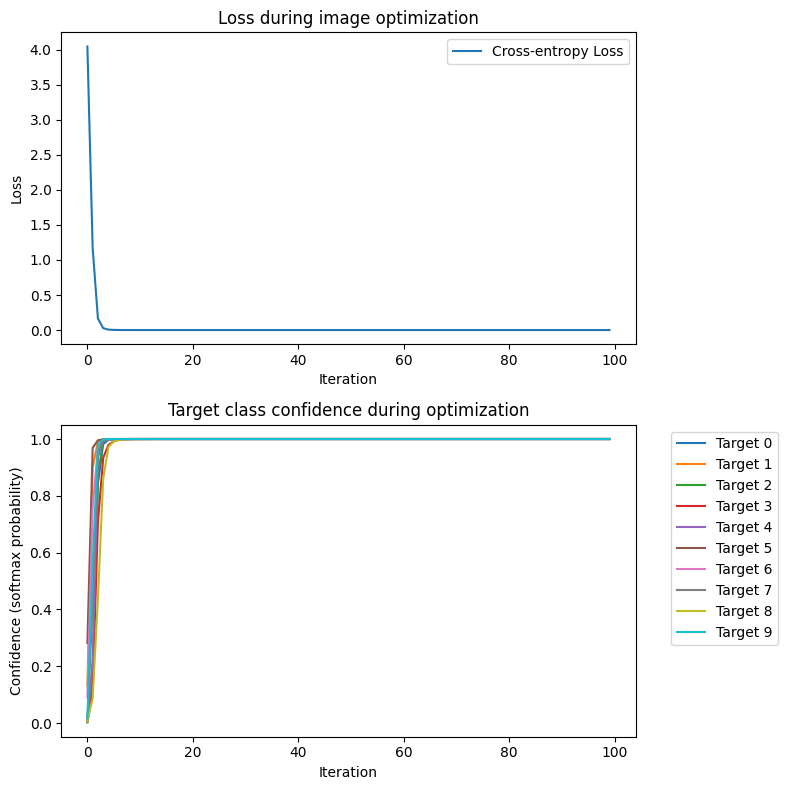

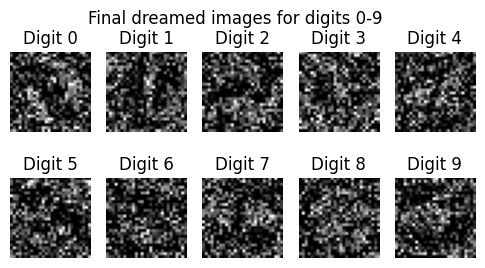

In [3]:
# Convert history lists to numpy arrays for plotting
loss_history = np.array(loss_history)
confidence_history = np.array(confidence_history)  # shape: (num_iterations, 10)

# Plot loss and confidence evolution
fig, axs = plt.subplots(2, 1, figsize=(8, 8))
# Plot the loss over iterations
axs[0].plot(loss_history, label="Cross-entropy Loss")
axs[0].set_title("Loss during image optimization")
axs[0].set_xlabel("Iteration")
axs[0].set_ylabel("Loss")
axs[0].legend()

# Plot the confidence of each target class over iterations
for digit in range(batch_size):
    axs[1].plot(confidence_history[:, digit], label=f"Target {digit}")
axs[1].set_title("Target class confidence during optimization")
axs[1].set_xlabel("Iteration")
axs[1].set_ylabel("Confidence (softmax probability)")
axs[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1.0))
plt.tight_layout()
plt.show()

# Display the final optimized images for each digit
final_images = frames[-1].clone().squeeze(1).numpy()  # shape (10, 28, 28)
# Unnormalize images to [0,1] range for visualization
final_images_unnorm = final_images * 0.3081 + 0.1307
final_images_unnorm = np.clip(final_images_unnorm, 0.0, 1.0)

fig, axes = plt.subplots(2, 5, figsize=(6, 3))
for i, ax in enumerate(axes.flat):
    ax.imshow(final_images_unnorm[i], cmap='gray')
    ax.set_title(f"Digit {i}")
    ax.axis('off')
plt.suptitle("Final dreamed images for digits 0-9")
plt.show()


In [4]:
from matplotlib import animation
from IPython.display import HTML

# Create a figure with 10 subplots (for digits 0-9)
fig, axes = plt.subplots(2, 5, figsize=(6, 3))
for ax in axes.flat:
    ax.axis('off')  # no axis for image display

# Prepare animation frames
ims = []
for frame in frames:
    # frame: tensor of shape (10, 1, 28, 28)
    img_batch = frame.squeeze(1).numpy()
    img_batch = img_batch * 0.3081 + 0.1307  # unnormalize to original scale
    img_batch = np.clip(img_batch, 0.0, 1.0)
    ims_frame = []
    for i, ax in enumerate(axes.flat):
        im = ax.imshow(img_batch[i], cmap='gray', animated=True)
        ims_frame.append(im)
    ims.append(ims_frame)

ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True, repeat_delay=1000)
plt.close()  # close the static plot display
HTML(ani.to_jshtml())


After running the optimization, the network was able to create one image for each digit (0–9) that it recognized with high confidence. The loss went down steadily, and the confidence for each target digit got closer to 1.0 over time. When looking at the final images, some of them actually look like real MNIST digits, but others are weird or noisy. This happens because the network doesn't care if the image looks like a digit to a human—it just adjusts the pixels to make sure its internal logic says “yes, this is a 5” or “this is a 9.” As a result, the generated images can be strange or messy. The model is basically “dreaming up” what it thinks a digit looks like, even if it doesn’t match real handwriting.



This came out weird, don't know how right I did this

**Task 2: Generate an Ambiguous Image (Resembling Multiple Digits)**

In [5]:
# Task 2: Optimize a single image to be ambiguous between two digits (e.g., 3 and 8)
model.eval()
for param in model.parameters():
    param.requires_grad = False

# Initialize a random image
ambiguous_image = torch.randn(1, 1, 28, 28, device=device, requires_grad=True)

# Desired target output: 50% class 3 and 50% class 8
target_dist = torch.tensor([[0.0] * 10], device=device)
target_dist[0, 3] = 0.5
target_dist[0, 8] = 0.5

optimizer = torch.optim.Adam([ambiguous_image], lr=0.1)
num_iterations = 100
loss_history2 = []
prob_history2 = []
frames2 = []

for it in range(num_iterations):
    optimizer.zero_grad()
    output = model(ambiguous_image)  # shape: [1, 10]
    # Compute log probabilities of the output
    log_probs = F.log_softmax(output, dim=1)
    # Cross-entropy loss with the target distribution (p = target_dist, q = output probabilities)
    loss = -(target_dist * log_probs).sum()
    loss.backward()
    optimizer.step()

    loss_history2.append(loss.item())
    # Record the probabilities of classes 3 and 8
    probs = F.softmax(output, dim=1)
    prob_history2.append(probs[0, [3, 8]].detach().cpu().numpy())
    frames2.append(ambiguous_image.detach().cpu().clone())

    if (it+1) % 20 == 0 or it == 0:
        p3 = probs[0, 3].item()
        p8 = probs[0, 8].item()
        print(f"Iteration {it+1}/{num_iterations}, Loss = {loss.item():.4f}, "
              f"P(class 3) = {p3:.2f}, P(class 8) = {p8:.2f}")


Iteration 1/100, Loss = 6.1288, P(class 3) = 0.02, P(class 8) = 0.00
Iteration 20/100, Loss = 0.7847, P(class 3) = 0.69, P(class 8) = 0.30
Iteration 40/100, Loss = 0.7134, P(class 3) = 0.58, P(class 8) = 0.41
Iteration 60/100, Loss = 0.6972, P(class 3) = 0.49, P(class 8) = 0.51
Iteration 80/100, Loss = 0.6959, P(class 3) = 0.51, P(class 8) = 0.49
Iteration 100/100, Loss = 0.6952, P(class 3) = 0.50, P(class 8) = 0.50


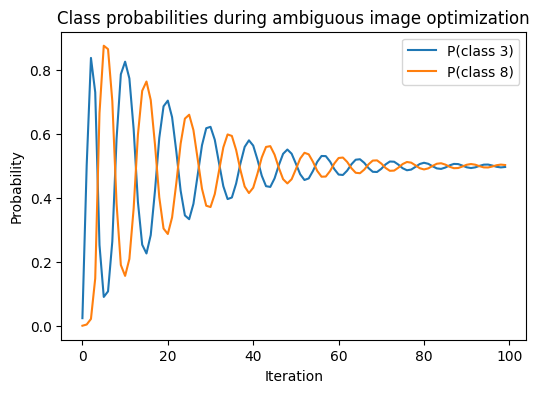

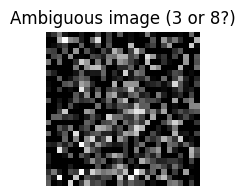

Final predicted class probabilities:
 [3.0346635e-06 3.2966276e-05 9.6625765e-04 4.9930739e-01 2.2600427e-06
 1.0528238e-05 2.2700927e-07 3.9547387e-05 4.9868745e-01 9.5041172e-04]


In [6]:
# Plot the probability of class 3 and class 8 over iterations
prob_history2 = np.array(prob_history2)  # shape: (num_iterations, 2)
plt.figure(figsize=(6, 4))
plt.plot(prob_history2[:, 0], label="P(class 3)")
plt.plot(prob_history2[:, 1], label="P(class 8)")
plt.title("Class probabilities during ambiguous image optimization")
plt.xlabel("Iteration")
plt.ylabel("Probability")
plt.legend()
plt.show()

# Show the final ambiguous image
final_amb_img = frames2[-1].squeeze().numpy()
final_amb_img = final_amb_img * 0.3081 + 0.1307  # unnormalize
final_amb_img = np.clip(final_amb_img, 0.0, 1.0)
plt.figure(figsize=(2, 2))
plt.imshow(final_amb_img, cmap='gray')
plt.title("Ambiguous image (3 or 8?)")
plt.axis('off')
plt.show()

# Display the final predicted probabilities for all classes
final_probs = F.softmax(model(ambiguous_image), dim=1)[0].detach().cpu().numpy()
print("Final predicted class probabilities:\n", final_probs)


In [7]:
ani2_fig = plt.figure(figsize=(2, 2))
plt.axis('off')
ims2 = []
for frame in frames2:
    img = frame.squeeze().numpy() * 0.3081 + 0.1307
    img = np.clip(img, 0.0, 1.0)
    im = plt.imshow(img, cmap='gray', animated=True)
    ims2.append([im])
ani2 = animation.ArtistAnimation(ani2_fig, ims2, interval=100, blit=True, repeat_delay=1000)
plt.close()
HTML(ani2.to_jshtml())


The plot of class probabilities should show that as the optimization progresses, the network's predicted probability for class 3 and class 8 move toward about 0.5 each. The final printout of probabilities will likely show class 3 and 8 with the highest values (around 0.5 each), and very low probabilities for other classes. The final ambiguous image might look like a blend of a 3 and an 8 (for example, it might have features of both digits).

**Task 3: Effect of L2 Regularization on the Dreamed Images**

In [8]:
# Task 3: Repeat image generation with different L2 regularization strengths
lambdas = [0.001, 0.01, 0.1, 1.0, 10.0]
final_images_for_lambda = []
confidence_for_lambda = []

for lambda_l2 in lambdas:
    print(f"\nOptimizing with L2 penalty, lambda = {lambda_l2}")
    # Fresh random noise images for 0-9
    images = torch.randn(10, 1, 28, 28, device=device, requires_grad=True)
    optimizer = torch.optim.Adam([images], lr=0.1)
    target_labels = torch.arange(0, 10, device=device)
    # Optimize as before, but include L2 term in loss
    for it in range(100):
        optimizer.zero_grad()
        outputs = model(images)
        ce_loss = F.cross_entropy(outputs, target_labels)
        l2_loss = images.pow(2).mean()  # mean of squared pixels
        loss = ce_loss + lambda_l2 * l2_loss
        loss.backward()
        optimizer.step()
    # Store the final images and confidence of each for analysis
    final_images_for_lambda.append(images.detach().cpu().clone())
    probs = F.softmax(outputs, dim=1)
    target_conf = probs[torch.arange(10), target_labels].detach().cpu().numpy()
    confidence_for_lambda.append(target_conf)
    # Evaluate how many are correctly classified as the intended digit
    preds = outputs.argmax(dim=1).detach().cpu().numpy()
    correct_count = (preds == np.arange(10)).sum()
    avg_conf = target_conf.mean()
    print(f"  -> {correct_count}/10 images correctly classified, average confidence = {avg_conf:.2f}")



Optimizing with L2 penalty, lambda = 0.001
  -> 10/10 images correctly classified, average confidence = 1.00

Optimizing with L2 penalty, lambda = 0.01
  -> 10/10 images correctly classified, average confidence = 1.00

Optimizing with L2 penalty, lambda = 0.1
  -> 10/10 images correctly classified, average confidence = 1.00

Optimizing with L2 penalty, lambda = 1.0
  -> 10/10 images correctly classified, average confidence = 1.00

Optimizing with L2 penalty, lambda = 10.0
  -> 10/10 images correctly classified, average confidence = 0.97


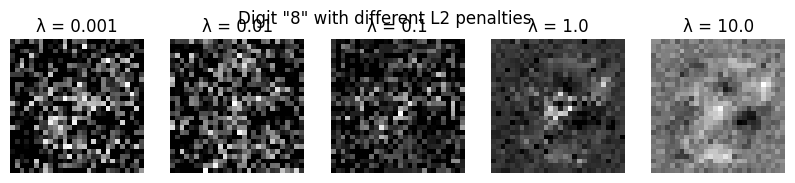

lambda=0.001: model confidence for digit 8 = 1.000
lambda=0.01: model confidence for digit 8 = 1.000
lambda=0.1: model confidence for digit 8 = 1.000
lambda=1.0: model confidence for digit 8 = 0.994
lambda=10.0: model confidence for digit 8 = 0.954


In [9]:
# Visualize the effect of L2 regularization on the generated image for digit 8
digit_to_show = 8
plt.figure(figsize=(10, 2))
for i, lambda_l2 in enumerate(lambdas):
    img = final_images_for_lambda[i][digit_to_show].squeeze(0).numpy()
    img = img * 0.3081 + 0.1307  # unnormalize
    img = np.clip(img, 0.0, 1.0)
    plt.subplot(1, len(lambdas), i+1)
    plt.imshow(img, cmap='gray')
    plt.title(f"λ = {lambda_l2}")
    plt.axis('off')
plt.suptitle(f'Digit "{digit_to_show}" with different L2 penalties')
plt.show()

# Print the confidence of the network for digit 8 under each lambda
confs = [conf[digit_to_show] for conf in confidence_for_lambda]
for lam, conf in zip(lambdas, confs):
    print(f"lambda={lam}: model confidence for digit {digit_to_show} = {conf:.3f}")


Adding an L2 penalty can trade off confidence for clarity: a moderate penalty yields cleaner, more human-recognizable digit images while still keeping high confidence, whereas an excessively strong penalty can make the images too vague to be recognized. This experiment demonstrates how regularization can be used in input space to guide the network's dreaming towards more plausible images.